In [1]:
import pickle
from helper_fxns import convert_param_vec_dict_to_param_dict, gelman_rubin_trace_dict, print_convergence_summary, sample_plots, create_trace_matrix, plot_histograms
from earm.lopez_embedded import model
%matplotlib inline
import os
import numpy as np
from corner import corner
import matplotlib.pyplot as plt
import seaborn as sns

/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/html.py:14: ShimWarning: The `IPython.html` package has been deprecated. You should import from `notebook` instead. `IPython.html.widgets` has moved to `ipywidgets`.
  "`IPython.html.widgets` has moved to `ipywidgets`.", ShimWarning)
/Users/Erin/Library/Python/2.7/lib/python/site-packages/IPython/utils/traitlets.py:5: UserWarning: IPython.utils.traitlets has moved to a top-level traitlets package.
  warn("IPython.utils.traitlets has moved to a top-level traitlets package.")


In [2]:
len(model.parameters_rules())

105

In [3]:
os.chdir('/Users/Erin/git/accre_data_analysis/normal_priors_sd3_nothin')

In [4]:
traces = {}
for trace in ['a', 'b', 'c', 'd']:
    traces[trace] = [np.load('earm_dreamzs_5chain_normal_'+str(trace)+'_sampled_params_chain_0.npy')]
    for chain in range(1, 5):
        traces[trace].append(np.load('earm_dreamzs_5chain_normal_'+str(trace)+'_sampled_params_chain_'+str(chain)+'.npy'))

In [5]:
logps = {}
for trace in ['a', 'b', 'c', 'd']:
    logps[trace] = [np.load('earm_dreamzs_5chain_normal_'+str(trace)+'_logps_chain_0.npy')]
    print 'Logp of trace: ',trace,' chain: 0 = ',logps[trace][-1]
    for chain in range(1, 5):
        logps[trace].append(np.load('earm_dreamzs_5chain_normal_'+str(trace)+'_logps_chain_'+str(chain)+'.npy'))
        print 'Logp of trace: ',trace,' chain: ',chain,' = ',logps[trace][-1][-1]

Logp of trace:  a  chain: 0 =  [[-174.52028739]
 [-174.52028739]
 [-174.52028739]
 ..., 
 [ 157.33123252]
 [ 157.33123252]
 [ 157.33123252]]
Logp of trace:  a  chain:  1  =  [ 151.81385956]
Logp of trace:  a  chain:  2  =  [ 160.05596428]
Logp of trace:  a  chain:  3  =  [ 145.77980001]
Logp of trace:  a  chain:  4  =  [ 158.24125043]
Logp of trace:  b  chain: 0 =  [[-1544.70084049]
 [-1544.70084049]
 [ -839.94430029]
 ..., 
 [  154.74858441]
 [  154.74858441]
 [  154.74858441]]
Logp of trace:  b  chain:  1  =  [ 157.98431528]
Logp of trace:  b  chain:  2  =  [ 142.52644845]
Logp of trace:  b  chain:  3  =  [ 147.36833776]
Logp of trace:  b  chain:  4  =  [ 142.04080723]
Logp of trace:  c  chain: 0 =  [[-500.00475418]
 [-500.00475418]
 [-500.00475418]
 ..., 
 [ 152.22851447]
 [ 152.22851447]
 [ 152.22851447]]
Logp of trace:  c  chain:  1  =  [ 156.3081243]
Logp of trace:  c  chain:  2  =  [ 159.72125596]
Logp of trace:  c  chain:  3  =  [ 160.45985061]
Logp of trace:  c  chain:  4  =  

In [6]:
traces['b'][0][:,72]

array([-1.23475609, -1.23475609, -1.18760524, ..., -1.10611413,
       -1.10611413, -1.10611413])

In [7]:
traces['a'][0][:,72]

array([-1.13504449, -1.13504449, -1.13504449, ..., -0.05701081,
       -0.05701081, -0.05701081])

In [8]:
param_trace_dicts = {}
param_trace_dict_a = {}
gelman_rubin_dicts = {}
param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]
for run in ['a', 'b', 'c', 'd']:
    for i, param in enumerate(model.parameters_rules()):
        param_trace_dict_a[param.name] = [traces[run][chain][:,i] for chain in range(len(traces[run]))]
    param_trace_dicts[run] = param_trace_dict_a
    gelman_rubin_dicts[run] = gelman_rubin_trace_dict(param_trace_dict_a)
    param_trace_dict_a = {}
    param_trace_dict_a['param_list'] = [param.name for param in model.parameters_rules()]

In [9]:
print_convergence_summary(param_trace_dicts['a'])

Number of parameters with GR below 1.2:  58  of  105  parameters.
Percent of parameters with GR below 1.2:  55.2380952381
Number of parameters with GR below 1.1:  22  of  105  parameters.
Percent of parameters with GR below 1.1:  20.9523809524


[58, 55.23809523809524, 22, 20.952380952380953]

In [10]:
print_convergence_summary(param_trace_dicts['b'])

Number of parameters with GR below 1.2:  58  of  105  parameters.
Percent of parameters with GR below 1.2:  55.2380952381
Number of parameters with GR below 1.1:  32  of  105  parameters.
Percent of parameters with GR below 1.1:  30.4761904762


[58, 55.23809523809524, 32, 30.476190476190478]

In [11]:
print_convergence_summary(param_trace_dicts['c'])

Number of parameters with GR below 1.2:  22  of  105  parameters.
Percent of parameters with GR below 1.2:  20.9523809524
Number of parameters with GR below 1.1:  9  of  105  parameters.
Percent of parameters with GR below 1.1:  8.57142857143


[22, 20.952380952380953, 9, 8.571428571428571]

In [12]:
print_convergence_summary(param_trace_dicts['d'])

Number of parameters with GR below 1.2:  87  of  105  parameters.
Percent of parameters with GR below 1.2:  82.8571428571
Number of parameters with GR below 1.1:  49  of  105  parameters.
Percent of parameters with GR below 1.1:  46.6666666667


[87, 82.85714285714286, 49, 46.666666666666664]

In [13]:
param_trace_dicts['d']['bind_L_R_to_LR_kf']

[array([-6.15050369, -6.15050369, -6.15050369, ..., -6.45597323,
        -6.45597323, -6.45597323]),
 array([-6.07262366, -6.07262366, -5.76293559, ..., -6.78405627,
        -6.78405627, -6.78405627]),
 array([-6.28659219, -6.28659219, -6.28659219, ..., -5.44293513,
        -5.44293513, -5.60807452]),
 array([-6.2607682 , -6.2607682 , -6.2607682 , ..., -5.43767396,
        -5.43767396, -5.43767396]),
 array([-6.32833813, -6.32833813, -6.32833813, ..., -7.4772208 ,
        -7.4772208 , -7.4772208 ])]

50000
5
50000


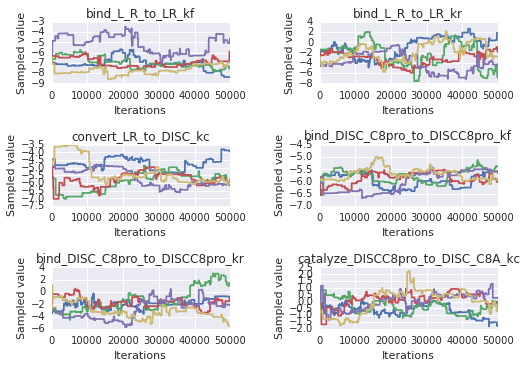

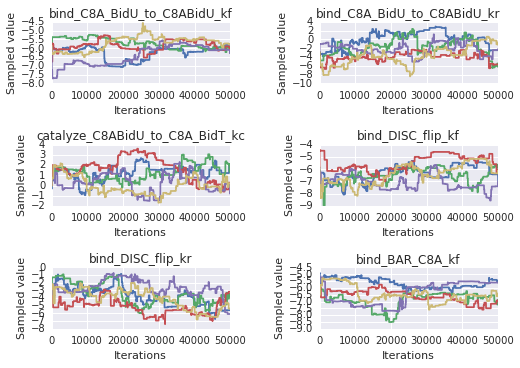

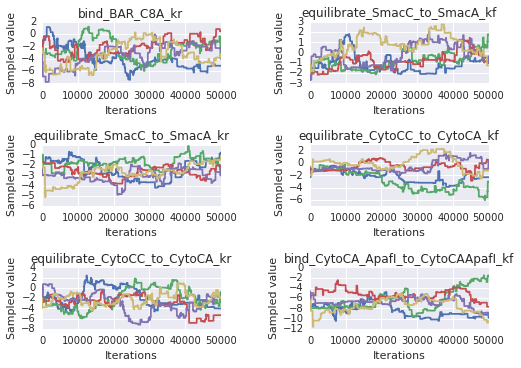

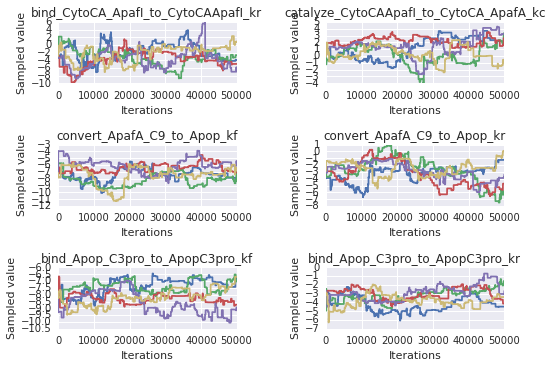

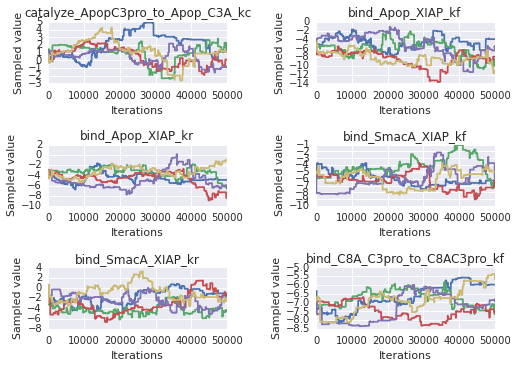

...

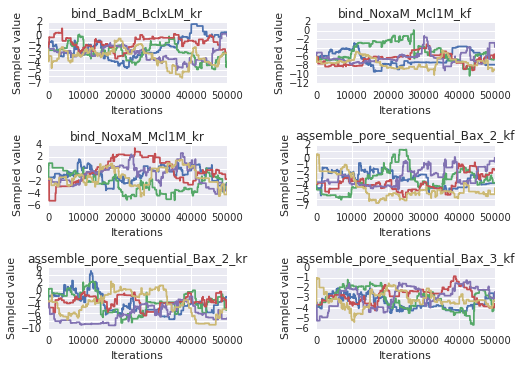

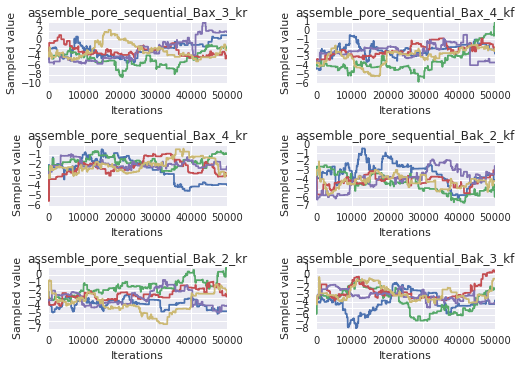

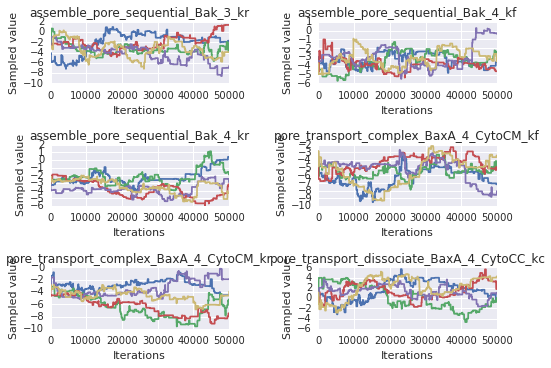

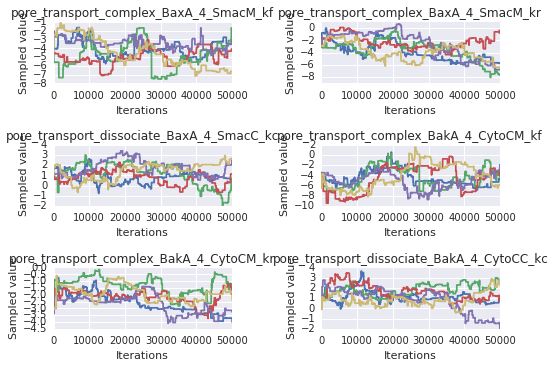

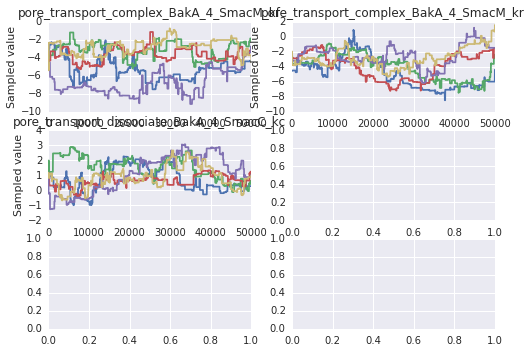

In [14]:
sample_plots(param_trace_dicts['a'])

In [16]:
trace_arr_a = create_trace_matrix(param_trace_dicts['a'], burnin=30000, thin=1)
trace_arr_b = create_trace_matrix(param_trace_dicts['b'], burnin=30000, thin=1)
trace_arr_c = create_trace_matrix(param_trace_dicts['c'], burnin=30000, thin=1)
trace_arr_d = create_trace_matrix(param_trace_dicts['d'], burnin=30000, thin=1)

/System/Library/Frameworks/Python.framework/Versions/2.7/Extras/lib/python/matplotlib/pyplot.py:412: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_num_figures`).
  max_open_warning, RuntimeWarning)


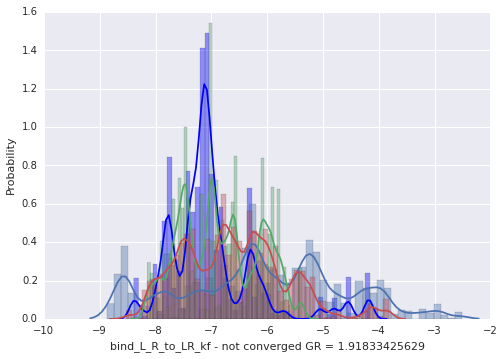

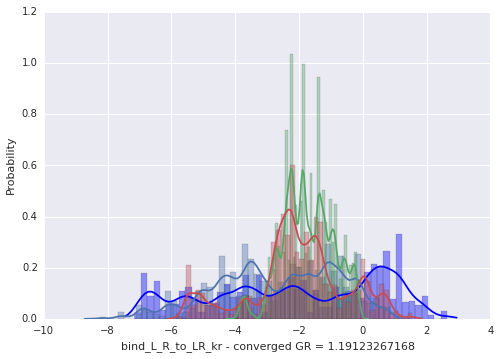

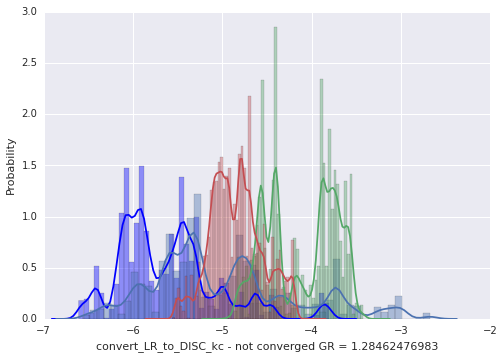

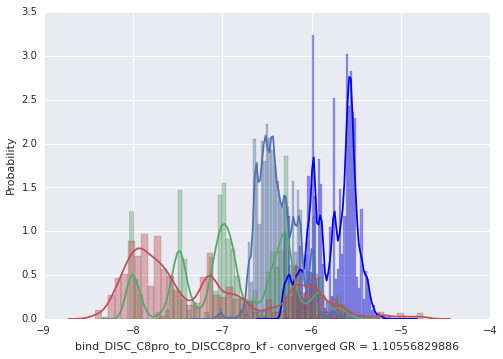

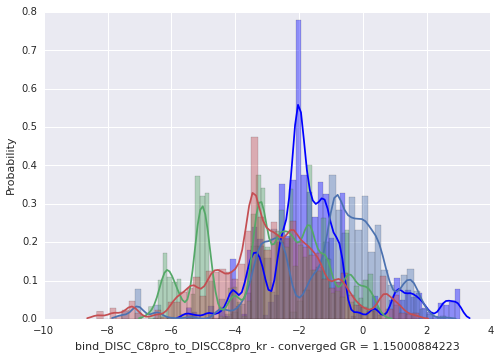

...

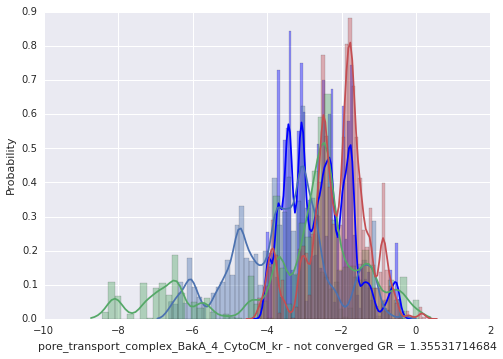

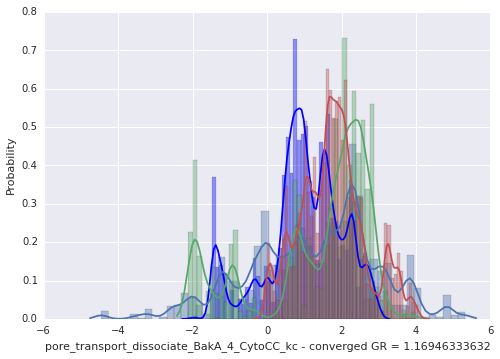

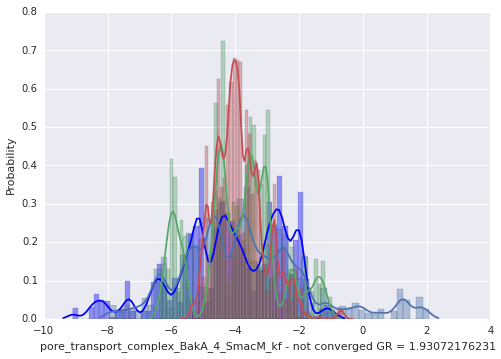

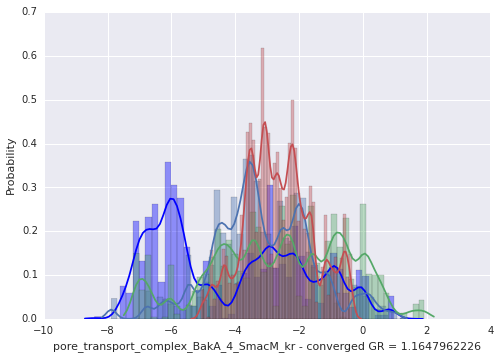

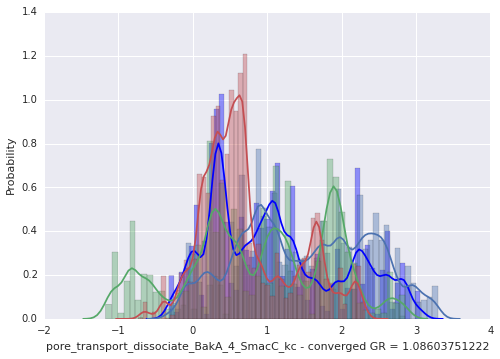

In [17]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    sns.plotting_context('notebook')
    ax = sns.distplot(trace_arr_a[:,dim], hist=True, color='b')
    sns.distplot(trace_arr_b[:,dim], hist=True)
    sns.distplot(trace_arr_c[:,dim], hist=True)
    sns.distplot(trace_arr_d[:,dim], hist=True)
    if gelman_rubin_dicts['a'][param_name] < 1.2:
        sns.axlabel(param_name+' - converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')
    else:
        sns.axlabel(param_name+' - not converged GR = '+str(gelman_rubin_dicts['a'][param_name]), 'Probability')

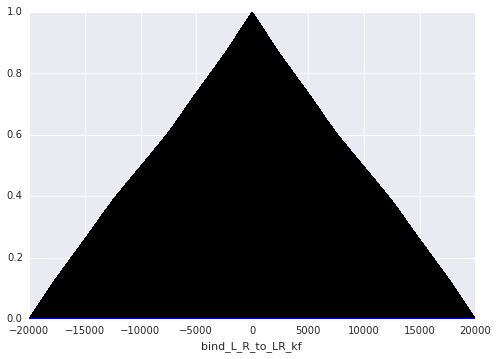

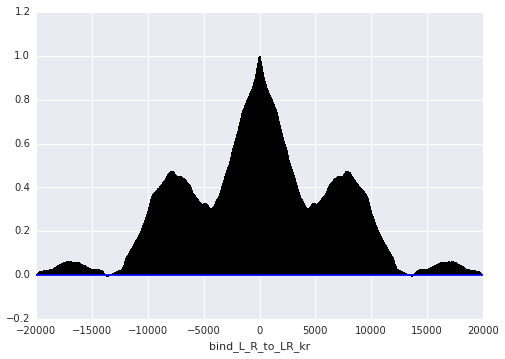

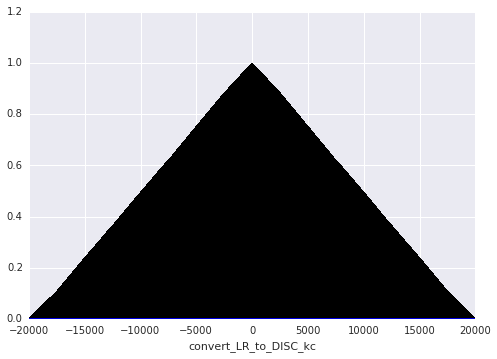

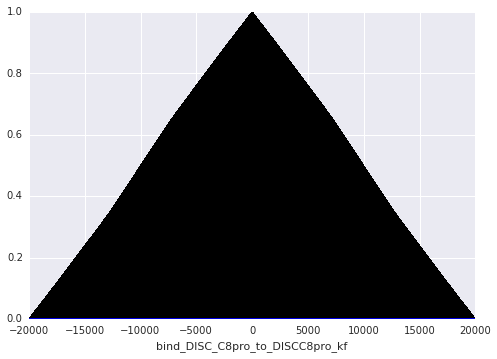

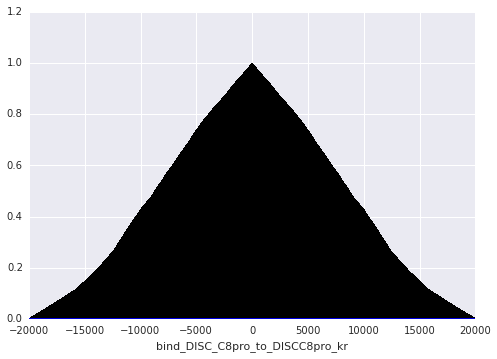

...

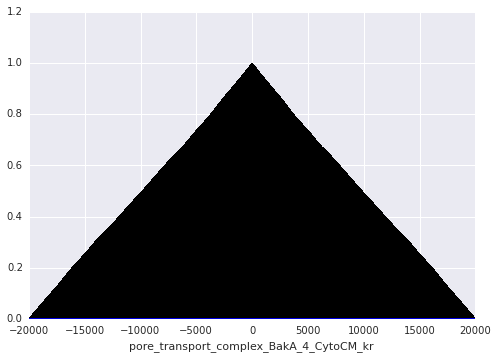

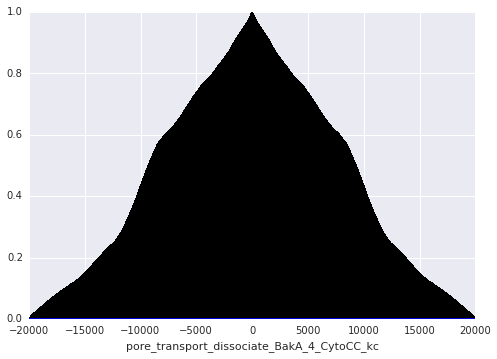

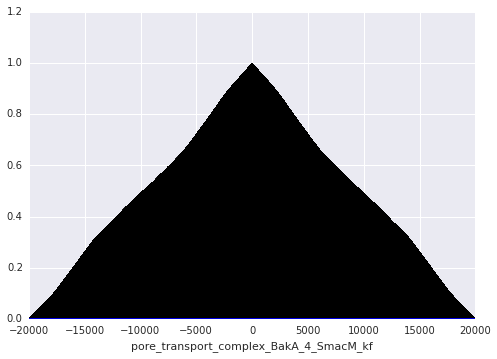

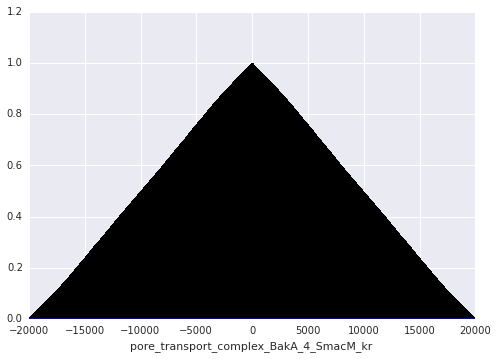

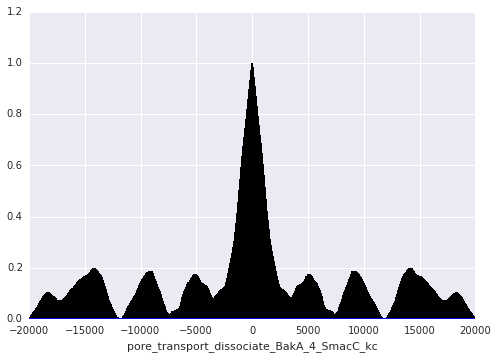

In [18]:
for dim, param_name in enumerate([param.name for param in model.parameters_rules()]):
    fig = plt.figure()
    plt.acorr(traces['a'][0][30000::,dim], maxlags=None)
    plt.xlabel(str(param_name))

In [ ]:
corner(trace_arr_a[:,50:60:], labels=param_trace_dict_a['param_list'][50:60], bins=10)